# AI for Dynamic Grid Management and Load Balancing

## 1) Problem Statement
- This project aims to develop an intelligent system for managing and optimizing electricity distribution in power grids using real-time data and advanced AI techniques.

Here we are trying to understand how grid stability(stab) and stability label of the system is affected by other variables such as adapt, power and delay

## 2) Data Collection
-  Data Source: https://archive.ics.uci.edu/dataset/471/electrical+grid+stability+simulated+data
- This dataset has 10000 rows and 14 columns

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

In [2]:
def load_csv_data(path):
    df = pd.read_csv(path)
    return df

smart_grid = load_csv_data("data/Power_Consumption.csv")
smart_grid.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [3]:
smart_grid.tail()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
9995,2.930406,9.487627,2.376523,6.187797,3.343416,-0.658054,-1.449106,-1.236256,0.601709,0.779642,0.813512,0.608385,0.023892,unstable
9996,3.392299,1.274827,2.954947,6.894759,4.349512,-1.663661,-0.952437,-1.733414,0.502079,0.567242,0.285880,0.366120,-0.025803,stable
9997,2.364034,2.842030,8.776391,1.008906,4.299976,-1.380719,-0.943884,-1.975373,0.487838,0.986505,0.149286,0.145984,-0.031810,stable
9998,9.631511,3.994398,2.757071,7.821347,2.514755,-0.966330,-0.649915,-0.898510,0.365246,0.587558,0.889118,0.818391,0.037789,unstable
9999,6.530527,6.781790,4.349695,8.673138,3.492807,-1.390285,-1.532193,-0.570329,0.073056,0.505441,0.378761,0.942631,0.045263,unstable


In [4]:
smart_grid.columns

Index(['tau1', 'tau2', 'tau3', 'tau4', 'p1', 'p2', 'p3', 'p4', 'g1', 'g2',
       'g3', 'g4', 'stab', 'stabf'],
      dtype='object')

In [5]:
smart_grid.columns = (smart_grid.columns.str.replace("tau","delay").str.replace("p", "power").str.replace("g","adapt"))
smart_grid.head()

,delay1,delay2,delay3,delay4,power1,power2,power3,power4,adapt1,adapt2,adapt3,adapt4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [6]:
smart_grid.shape

(10000, 14)

## Dataset Information

**Features**
- delay[x]: how long it takes for each node to adapt their production or consumption in seconds. tau1 -  the value for electricity producer
- power[x]: power produced or consumed; p1 = abs(p2+p3+p4)
- adapt[x]: willingness of each node to adapt their consumption or production per second(gamma proportional to price elasticity). g1 -  the value for electricity producer

**Targets**
- stab: the maximal real part of the characteritic equation root i.e. a number representing grid stability (if positive - the system is linearly unstable)(real)
- stabf: the stability label of the system i.e. the categorical version of stab (categorical: stable/unstable)

**Info from the dataset link above


## Data Checks to perform
- Check Missing values
- Check Duplicates
- Check data type
- Check the number of unique values of each column
- Check statistics of data set
- Check various categories present in the different categorical column

### Check Missing Values

In [7]:
smart_grid.isna().sum()

delay1    0
delay2    0
delay3    0
delay4    0
power1    0
power2    0
power3    0
power4    0
adapt1    0
adapt2    0
adapt3    0
adapt4    0
stab      0
stabf     0
dtype: int64

**Insights**
- No missing values ensures no need for imputation

### Check duplicates

In [8]:
smart_grid.duplicated().sum()

0

**There are no duplicate values in the dataset**

### Check data types

In [9]:
# Check Null and Dtypes
smart_grid.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   delay1  10000 non-null  float64
 1   delay2  10000 non-null  float64
 2   delay3  10000 non-null  float64
 3   delay4  10000 non-null  float64
 4   power1  10000 non-null  float64
 5   power2  10000 non-null  float64
 6   power3  10000 non-null  float64
 7   power4  10000 non-null  float64
 8   adapt1  10000 non-null  float64
 9   adapt2  10000 non-null  float64
 10  adapt3  10000 non-null  float64
 11  adapt4  10000 non-null  float64
 12  stab    10000 non-null  float64
 13  stabf   10000 non-null  object 
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


### Checking the number of unique values of each column

In [10]:
smart_grid.nunique()

delay1    10000
delay2    10000
delay3    10000
delay4    10000
power1    10000
power2    10000
power3    10000
power4    10000
adapt1    10000
adapt2    10000
adapt3    10000
adapt4    10000
stab      10000
stabf         2
dtype: int64

### Check statistics of each column

In [11]:
smart_grid.describe()

,delay1,delay2,delay3,delay4,power1,power2,power3,power4,adapt1,adapt2,adapt3,adapt4,stab
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5.250000,5.250001,5.250004,5.249997,3.750000,-1.250000,-1.250000,-1.250000,0.525000,0.525000,0.525000,0.525000,0.015731
std,2.742548,2.742549,2.742549,2.742556,0.752160,0.433035,0.433035,0.433035,0.274256,0.274255,0.274255,0.274255,0.036919
min,0.500793,0.500141,0.500788,0.500473,1.582590,-1.999891,-1.999945,-1.999926,0.050009,0.050053,0.050054,0.050028,-0.080760
25%,2.874892,2.875140,2.875522,2.874950,3.218300,-1.624901,-1.625025,-1.624960,0.287521,0.287552,0.287514,0.287494,-0.015557
50%,5.250004,5.249981,5.249979,5.249734,3.751025,-1.249966,-1.249974,-1.250007,0.525009,0.525003,0.525015,0.525002,0.017142
75%,7.624690,7.624893,7.624948,7.624838,4.282420,-0.874977,-0.875043,-0.875065,0.762435,0.762490,0.762440,0.762433,0.044878
max,9.999469,9.999837,9.999450,9.999443,5.864418,-0.500108,-0.500072,-0.500025,0.999937,0.999944,0.999982,0.999930,0.109403


#### Insights
- From above description of numerical data, the means of each of the variants of tau, p, g are almost the same
- All the standard deviations are almost the same for each of the variants of tau and g, however, they differ slightly for the variants of p i.e. column power1 differs from the rest of the variants of p
- The minimum and maximum are nearly identical for each variant of tau, and g, however for p, the variants power1 differs from the rest of the variants of p

### Checking the unique values for the categorical variables

In [12]:
print("Categories in 'stabf' variable: ", end= " ")
print(smart_grid['stabf'].unique())

Categories in 'stabf' variable:  ['unstable' 'stable']


In [13]:
smart_grid['stabf'].value_counts()

stabf
unstable    6380
stable      3620
Name: count, dtype: int64

# Univariate Analysis


### Distribution of Stab(Stability Indicator)

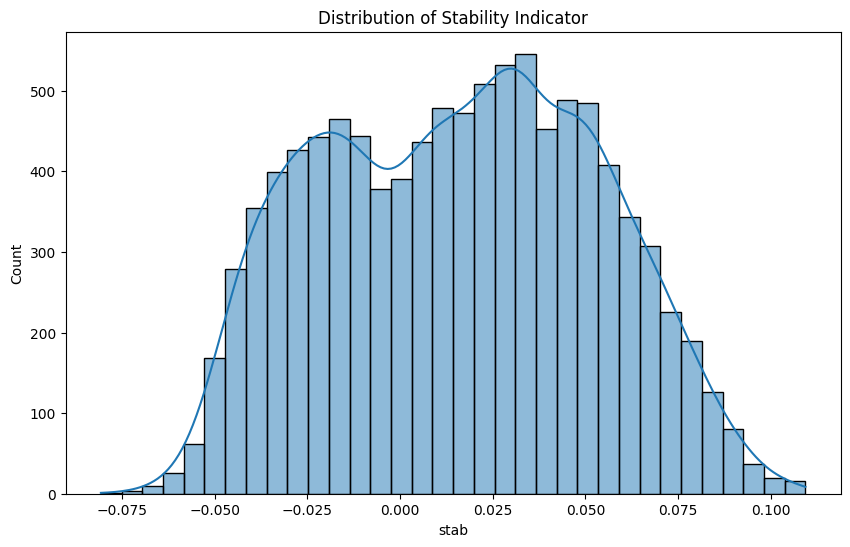

In [14]:
plt.figure(figsize=(10,6))
sns.histplot(smart_grid['stab'], kde=True)
plt.title('Distribution of Stability Indicator')
plt.show()

### Countplot for Stability label (Stabf)

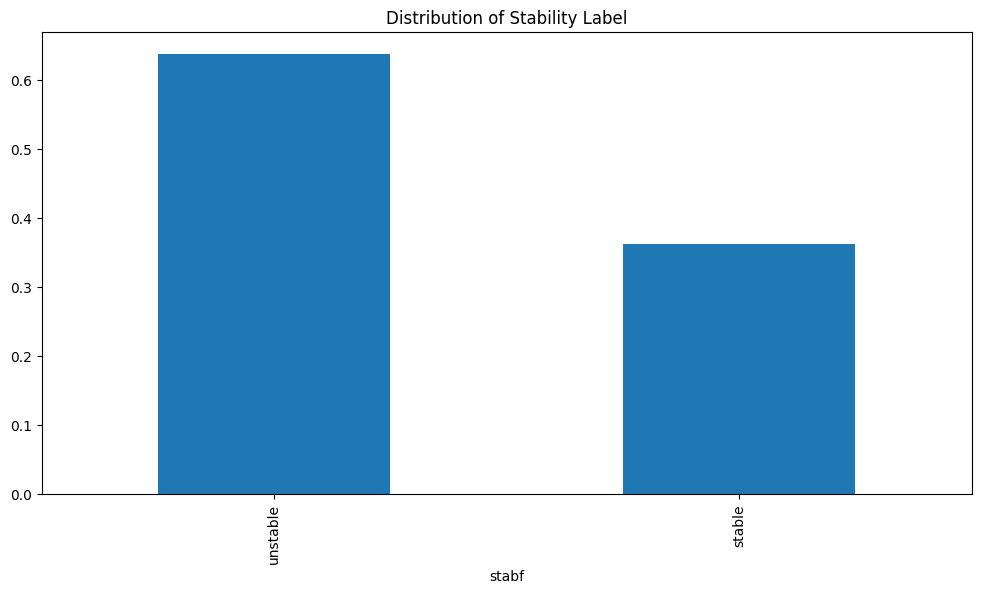

In [15]:
fig = plt.figure(figsize=(12,6))
#sns.countplot(smart_grid["stabf"])
smart_grid["stabf"].value_counts(normalize=True).plot(kind="bar")
plt.title("Distribution of Stability Label")
plt.show()

# Correlation Analysis

- Examining the relationship between the numerical variables

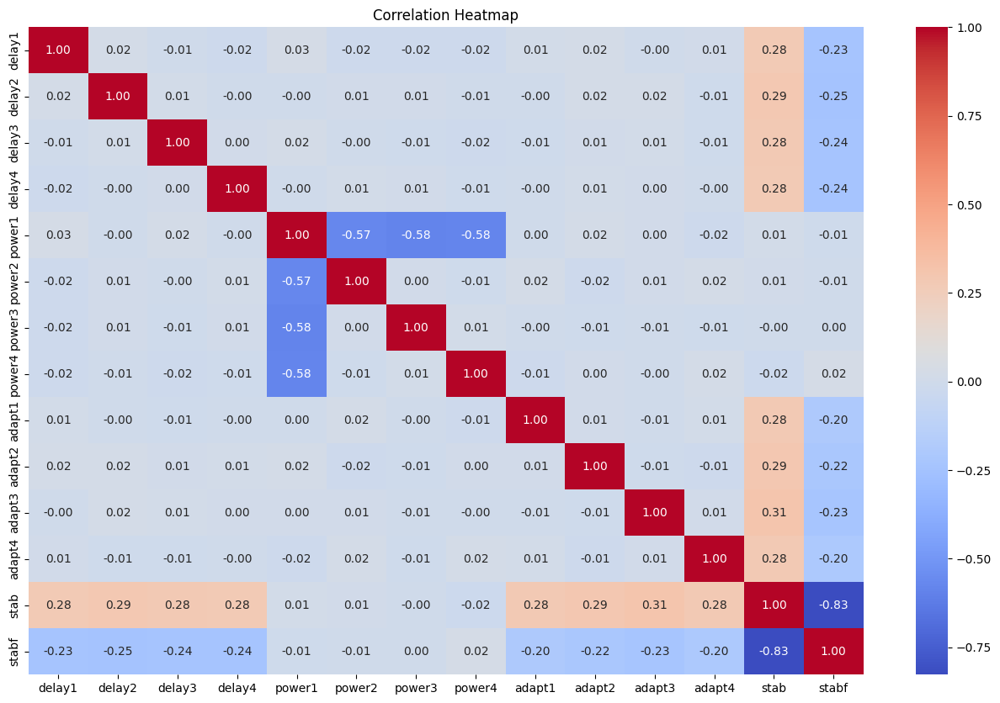

In [16]:
# Replacing the 
smart_grid = smart_grid.assign(stabf=lambda x: x.stabf.replace({"unstable": 0, "stable": 1}))


plt.figure(figsize=(16,10))
sns.heatmap(smart_grid.corr(), annot=True, fmt = ".2f", cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

**Insights**
-  We can see that the correlation between stability (i.e. stab or stabf) and delay[x] or adapt[x] is weak, while there was essentially no correlation between power[x] columns and stability
- power1(power generated) has a stronger negative correlation with the other power[x](power consumed) columns, as we know p1 = abs(p2+p3+p4), but there was no obvious correlation within the delay[x] or adapt[x] columns

### Distribution of delay, adapt and power columns

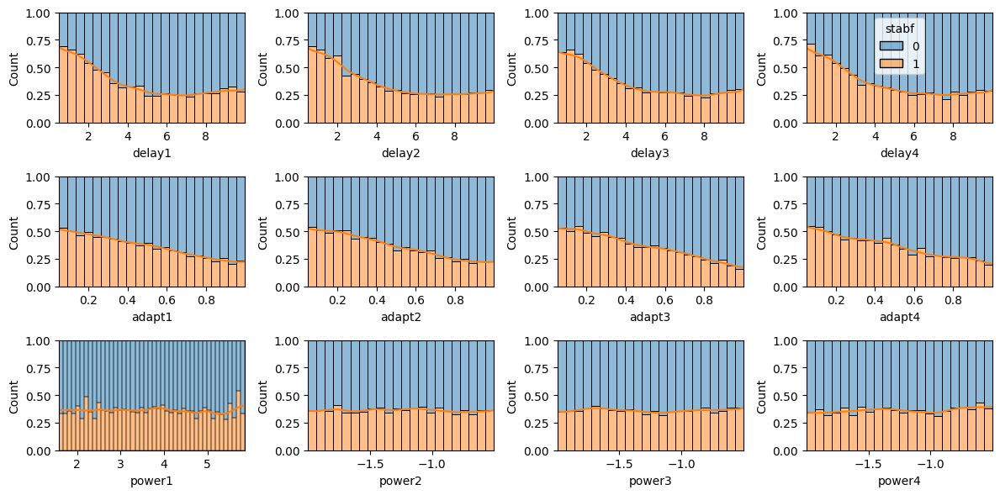

In [17]:
fig, axs = plt.subplots(3, 4, figsize=(12, 6))

for row_index, feature_type in enumerate(["delay", "adapt", "power"]):
    for col_index in range(4):
        show_legend = True if (row_index==0) & (col_index==3) else False
        sns.histplot(smart_grid, x=feature_type + str(col_index+1), kde=True, hue="stabf", multiple="fill", ax=axs[row_index,col_index], legend=show_legend)
plt.tight_layout()
plt.show() 

### Insights
- Since the distributions of all the values in the columns of tau[x] are uniform, all the values have approximately the same frequency or probability of occurrence.
- This indicates there is no inherent trend in the values.
- Similarly for power[x], since the distributions of all the values in the columns of power[x] (where x ranges from 2 to 4 inclusive, are uniform), all the values have approximately the same frequency or probability of occurrence.
- power1 has a normal distribution whereas the other columns of power[x] have a uniform distribution as power1 = abs(power2+power3+power4) 
- Since the distributions of all the values in the columns of g[x] are uniform, all the values have approximately the same frequency or probability of occurrence.
- This indicates there is no inherent trend in the values.

## Univariate Analysis 
- Checking for outliers for tau, p and g

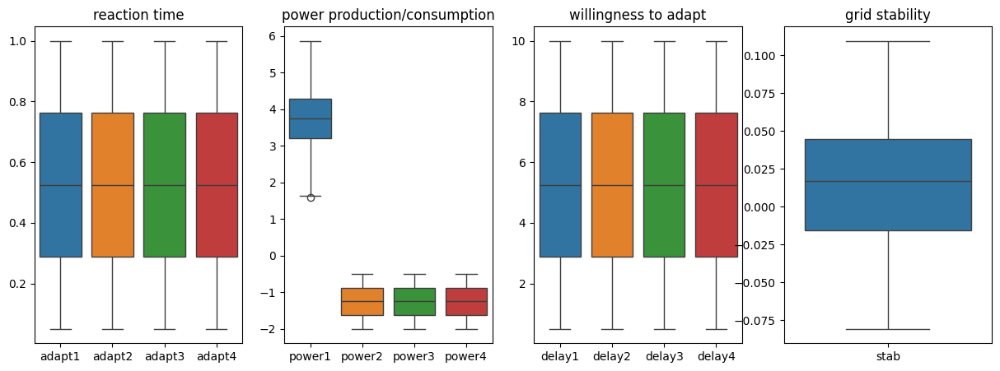

In [18]:
fig, axs= plt.subplots(1,4, figsize=(15,5))

# Creating the boxplots for the feature variables
for axs_ind, feature_group in enumerate(["adapt", "power", "delay"]):
    feature_columns = [feature_group + str(i+1) for i in range(4)]
    sns.boxplot(data = smart_grid[feature_columns], ax = axs[axs_ind])

# Creating the boxplot for stability
sns.boxplot(data = smart_grid[["stab"]], ax=axs[3])

for axs_ind, title in enumerate(["reaction time", "power production/consumption", "willingness to adapt", "grid stability"]):
    axs[axs_ind].set(title=title)

### Insights
- There are no outliers in the delays i.e. tau[x]
- There are no outliers in adapt i.e. g[x]
- There is a single outlier in power1

# Scaling features

### Insights
- There are no outliers in stab

# Bivariate Analysis

### Insights
- Here we can see that for the average and total of each of the columns of tau, p and g, the stab is stable only when it is below 0.00 and unstable above 0.000

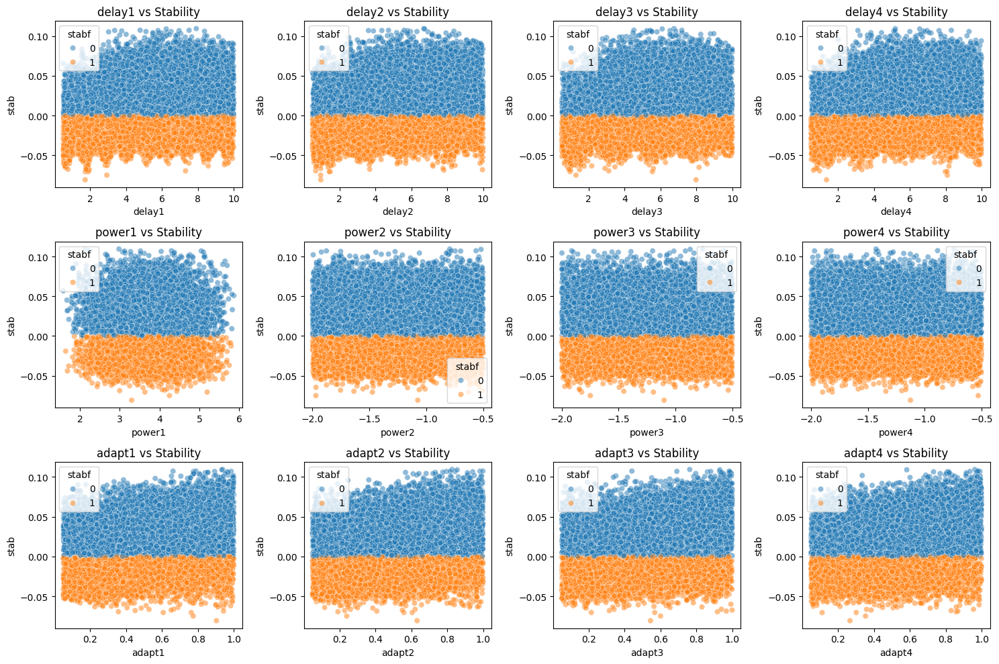

In [19]:
plt.figure(figsize=(15,10))
for i, col in enumerate(["delay1", "delay2", "delay3", "delay4","power1", "power2", "power3", "power4", "adapt1", "adapt2", "adapt3", "adapt4"]):
    plt.subplot(3,4,i+1)
    sns.scatterplot(x=col, y= "stab",data=smart_grid, hue="stabf", alpha=0.5)
    plt.title(f"{col} vs Stability")
plt.tight_layout()
plt.show()

### Insights
- Similarly as we saw above, here we can see that for each of the columns of tau, p and g, the stab is stable only when it is below 0.000 and unstable above 0.000

In [20]:
plt.figure(figsize=(12,6))
for i, col in enumerate(tau_columns):
    plt.subplot(2,2,i+1)
    sns.boxplot(x="stabf",y=col, data=smart_grid)
    plt.title(f"{col} vs Stability")
plt.tight_layout()
plt.show()

NameError: name 'tau_columns' is not defined

<Figure size 1200x600 with 0 Axes>

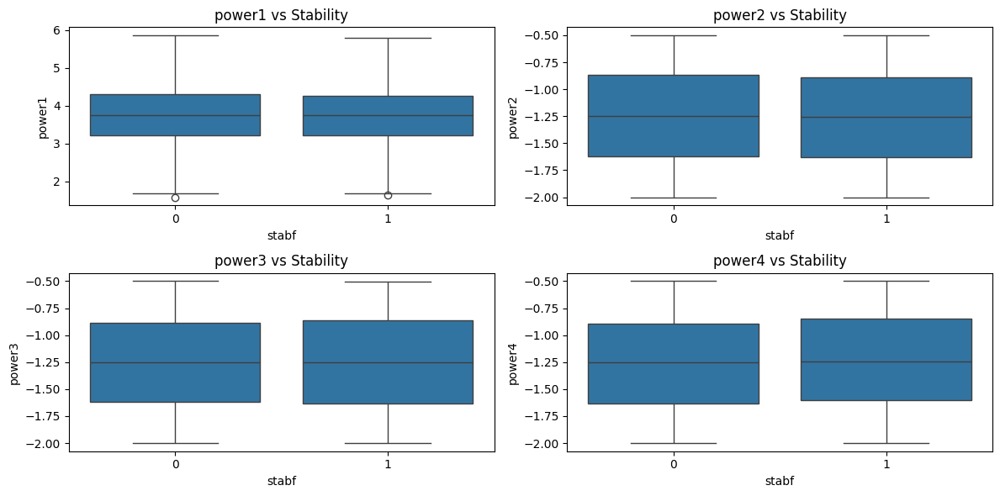

In [366]:
plt.figure(figsize=(12,6))
for i, col in enumerate(p_columns):
    plt.subplot(2,2,i+1)
    sns.boxplot(x="stabf", y=col, data=smart_grid)
    plt.title(f"{col} vs Stability")
plt.tight_layout()
plt.show()


Here we see there is an outlier in power1, and from the histogram above for power1, it is normally distributed, hence we will use Zscore to take care of the outlier.

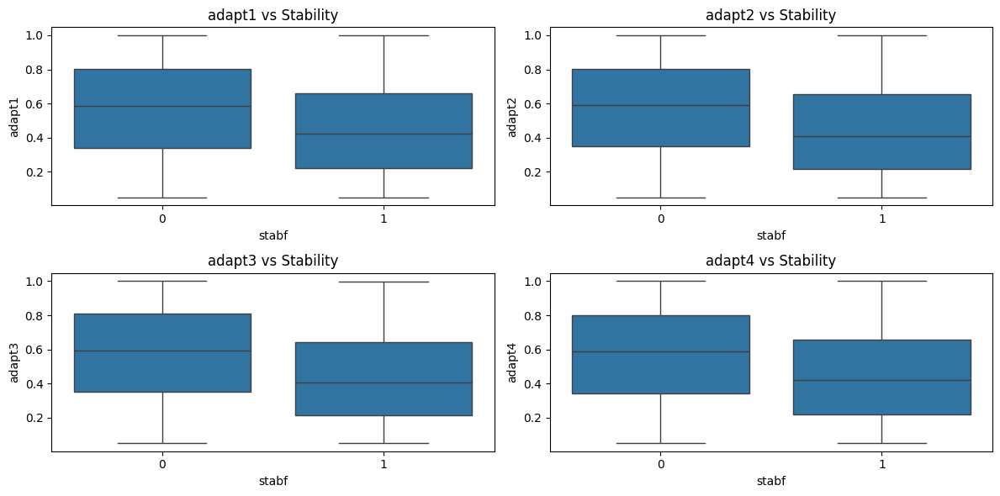

In [28]:
adapt_columns = ["adapt1", "adapt2", "adapt3", "adapt4"]
plt.figure(figsize=(12,6))
for i, col in enumerate(adapt_columns):
    plt.subplot(2,2,i+1)
    sns.boxplot(x="stabf", y=col, data=smart_grid)
    plt.title(f"{col} vs Stability")
plt.tight_layout()
plt.show()

In [368]:
def remove_outliers(smart_grid, col, threshold=3):
    zscores= np.abs(stats.zscore(smart_grid[col]))
    outlier_mask = zscores > threshold
    smart_grid_cleaned = smart_grid[~outlier_mask]
    return smart_grid_cleaned


smart_grid_new = remove_outliers(smart_grid, "power1", threshold=3)
smart_grid_new


,delay1,delay2,delay3,delay4,power1,power2,power3,power4,adapt1,adapt2,adapt3,adapt4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,0
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,1
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,0
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,0
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2.930406,9.487627,2.376523,6.187797,3.343416,-0.658054,-1.449106,-1.236256,0.601709,0.779642,0.813512,0.608385,0.023892,0
9996,3.392299,1.274827,2.954947,6.894759,4.349512,-1.663661,-0.952437,-1.733414,0.502079,0.567242,0.285880,0.366120,-0.025803,1
9997,2.364034,2.842030,8.776391,1.008906,4.299976,-1.380719,-0.943884,-1.975373,0.487838,0.986505,0.149286,0.145984,-0.031810,1
9998,9.631511,3.994398,2.757071,7.821347,2.514755,-0.966330,-0.649915,-0.898510,0.365246,0.587558,0.889118,0.818391,0.037789,0


<Axes: xlabel='total_adapt', ylabel='Count'>

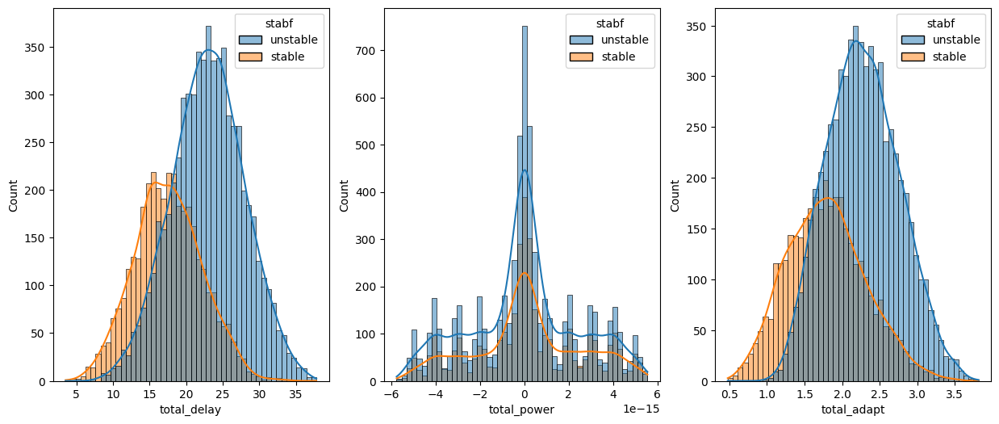

In [226]:
"""f, axs = plt.subplots(1,3, figsize=(15,6))
plt.subplot(131)
sns.histplot(data=smart_grid,x="total_delay", bins=50, kde=True, color="g", hue="stabf")
plt.subplot(132)
sns.histplot(data=smart_grid, x="total_power", bins=50, kde=True, color="orange", hue="stabf")
plt.subplot(133)
sns.histplot(data=smart_grid, x="total_adapt", bins=50, kde=True, hue="stabf")"""

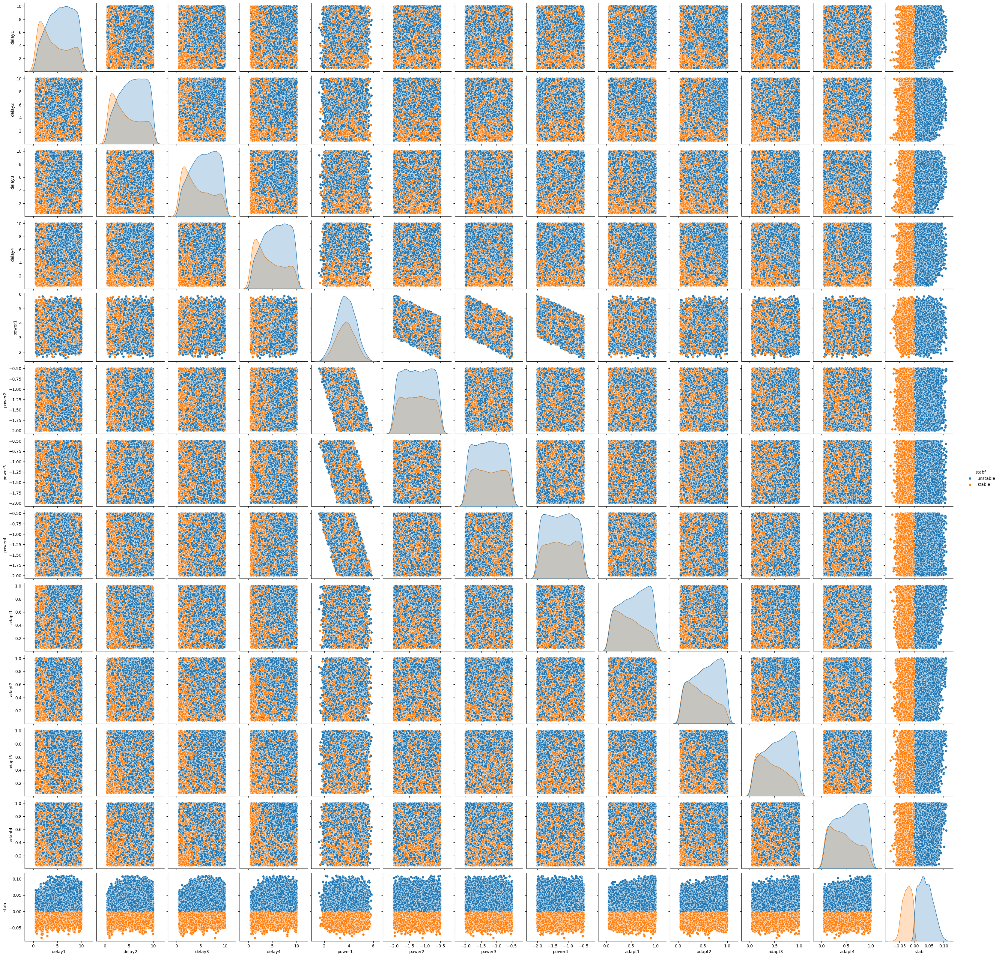

In [300]:
smart_grid_new
sns.pairplot(smart_grid, hue="stabf", diag_kind="kde")